In [1]:
%load_ext autoreload
%autoreload 2
import sys
# instead of creating a package using setup.py or building from a docker/singularity file,
# import the sister directory of src code to be called on in notebook.
# This keeps the notebook free from code to only hold visualizations and is easier to test
# It also helps keep the state of variables clean such that cells aren't run out of order with a mysterious state
sys.path.append("..")

In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
#import sklearn.cluster.hierarchical as hclust
from sklearn import preprocessing
import seaborn as sns

from src import most_recent_mesonet_data
from src import most_recent_mesonet_time
from src import landtype_describe
from src.plotting_scripts import landtype
import os
import pandas as pd
import cartopy.crs as crs
import cartopy.feature as cfeature

Matplotlib created a temporary config/cache directory at /tmp/tmp.qKefWmCOk3/matplotlib-25psr2qv because the default path (/home/aevans/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [3]:
def plurality_plot(df):
    projPC = crs.PlateCarree()
    latN = df['lat'].max()+1
    latS = df['lat'].min()-1
    lonW = df['lon'].max()+1
    lonE = df['lon'].min()-1
    cLat = (latN + latS) / 2
    cLon = (lonW + lonE) / 2
    projLcc = crs.LambertConformal(central_longitude=cLon, central_latitude=cLat)

    fig, ax = plt.subplots(figsize=(12,9), subplot_kw={'projection': crs.PlateCarree()}, dpi = 400)
    ax.set_extent([lonW, lonE, latS, latN], crs=projPC)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle='--');
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.STATES)
    ax.xticklabels_top = False
    ax.ylabels_right = False
    ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                    linewidth=2, color='black', alpha=0.5, linestyle='--')
    ax.scatter(x=df['lon'],
                                        y=df['lat'],
                                        c=df['color'],
                                        s=40,
                                        marker = 'o',
                                        edgecolor = 'black',
                                        transform=crs.PlateCarree()
                                        )
    ax.set_title('Mesonet Site Groups', size=16)
    ax.set_xlabel('Longitude',size=14)
    ax.set_ylabel('Latitude',size=14)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.grid()

In [4]:
#get lons and lats 
# This will return the most recent data avail on mesonet 
# this is my file path
ny_mesonet_data_path = '/home/aevans/nysm/archive/nysm/netcdf/proc'
ok_mesonet_data_path = '/home/aevans/landtype/geoinfo.csv'

In [5]:
# create a dataframe of mesonet data ok
ok_df = pd.read_csv(ok_mesonet_data_path)

In [6]:
ok_df_lons = ok_df['elon'].to_list()
ok_df_lats = ok_df['nlat'].to_list()

In [7]:
df_lulc = pd.read_csv('/home/aevans/landtype/data/OKbuffer_10_percent.csv')

In [8]:
#exclude the categorical columns
features = df_lulc.drop(['site', 'station'],axis=1)

In [9]:
features.describe()

,11,21,22,23,24,41,42,43,52,71,81,82,90,95,31
count,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000
mean,1.874164,3.715768,2.504116,2.083639,0.861909,16.690175,1.901683,1.658733,4.092376,30.862987,15.066075,17.170205,1.014723,0.304218,0.199229
std,3.172409,2.009457,3.600284,4.932372,2.844009,15.766093,5.922228,3.985787,8.248965,23.568557,18.855554,22.278505,2.121504,0.469732,0.616202
min,0.010601,0.730887,0.058453,0.010602,0.000573,0.000000,0.000000,0.000000,0.001719,0.099992,0.000000,0.000000,0.000000,0.001433,0.000000
25%,0.415510,2.630567,0.832678,0.372823,0.060026,1.390324,0.007449,0.020844,0.523312,6.672437,0.310534,0.627027,0.025213,0.049423,0.016834
50%,0.847804,3.193863,1.297795,0.676315,0.154284,12.904463,0.130650,0.099420,1.252214,31.478243,7.199964,6.064312,0.135382,0.134521,0.045413
75%,2.001355,4.231059,2.209645,1.474033,0.413811,28.807329,0.749366,0.993315,2.638192,48.922440,25.861897,27.770333,0.882668,0.325348,0.155863
max,29.973383,13.051501,20.843147,34.930663,22.859722,75.012177,43.345281,21.665086,40.729800,91.849154,75.678332,79.273918,14.326848,2.713536,6.579332


In [10]:
# noramalize data
scaler = preprocessing.MinMaxScaler()
features_normal = scaler.fit_transform(features)

In [11]:
pd.DataFrame(features_normal).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
count,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000
mean,0.062196,0.242267,0.117667,0.059365,0.037680,0.222500,0.043873,0.076562,0.100438,0.335295,0.199080,0.216593,0.070827,0.111642,0.030281
std,0.105878,0.163097,0.173218,0.141248,0.124414,0.210180,0.136629,0.183973,0.202538,0.256880,0.249154,0.281032,0.148079,0.173199,0.093657
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.013514,0.154187,0.037250,0.010373,0.002601,0.018535,0.000172,0.000962,0.012807,0.071635,0.004103,0.007910,0.001760,0.017695,0.002559
50%,0.027941,0.199907,0.059628,0.019064,0.006724,0.172032,0.003014,0.004589,0.030704,0.342000,0.095139,0.076498,0.009450,0.049072,0.006902
75%,0.066441,0.284091,0.103499,0.041908,0.018078,0.384035,0.017288,0.045849,0.064734,0.532130,0.341735,0.350309,0.061609,0.119433,0.023690
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [12]:
# kmeans clustering 
inertia = []
K = range(1,20)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_normal)
    kmeanModel.fit(features_normal)
    inertia.append(kmeanModel.inertia_)

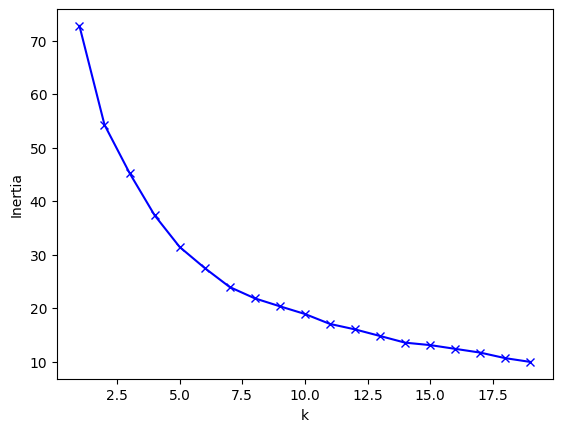

In [13]:
# Plot the elbow
plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.show()

In [14]:
# let's say our elbow is 12
kmeans = KMeans(n_clusters=6).fit(features_normal)

In [15]:
labels = pd.DataFrame(kmeans.labels_) #This is where the label output of the KMeans we just ran lives. Make it a dataframe so we can concatenate back to the original data
labeledClasses = pd.concat((features,labels),axis=1)
labeledClasses = labeledClasses.rename({0:'labels'},axis=1)

In [16]:
labeledClasses.head()

,11,21,22,23,24,41,42,43,52,71,81,82,90,95,31,labels
0,0.332355,3.116118,0.919708,0.467876,0.086527,16.744980,0.036960,0.042977,1.436291,70.056214,0.795074,5.890426,0.016618,0.057876,0.000000,0
1,0.764413,5.189585,4.973268,3.738690,1.367520,40.982907,0.226917,0.289377,1.609622,31.853214,8.781867,0.053005,0.004871,0.013753,0.150992,2
2,0.510838,4.186125,4.143149,1.960840,1.050900,0.495367,0.024353,0.610829,6.516271,1.212776,0.094260,76.075683,2.959024,0.143826,0.015758,5
3,0.176787,2.495645,1.090233,0.849837,0.167045,0.107734,0.000287,0.000000,0.007736,35.968230,0.410879,58.206975,0.118049,0.321769,0.078795,5
4,0.556138,2.765219,2.132579,1.728297,0.351275,0.242970,0.001719,0.060743,0.019770,29.984184,0.042119,61.585495,0.220622,0.262167,0.046703,5


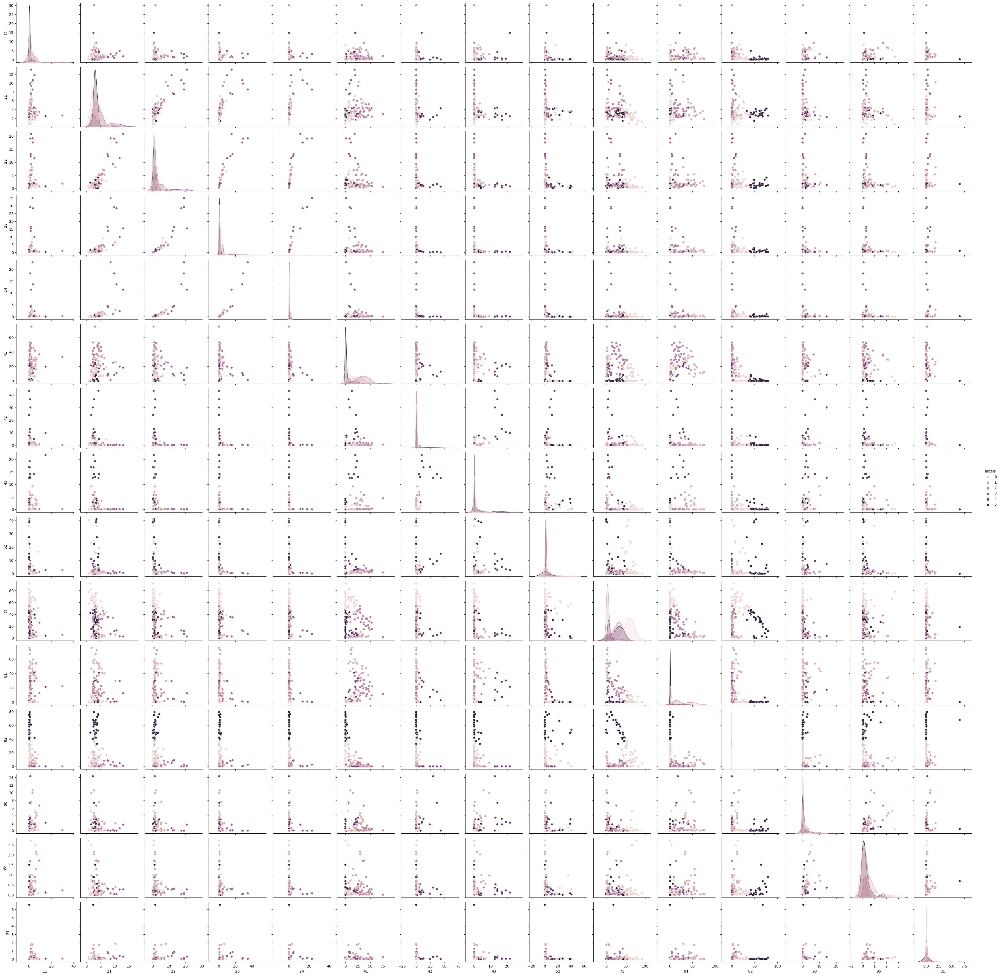

In [17]:
sns.pairplot(labeledClasses,hue='labels')

In [18]:
labeledClasses['Constant'] = "Data" #This is just to add something constant for the strip/swarm plots' X axis. Can be anything you want it to be.

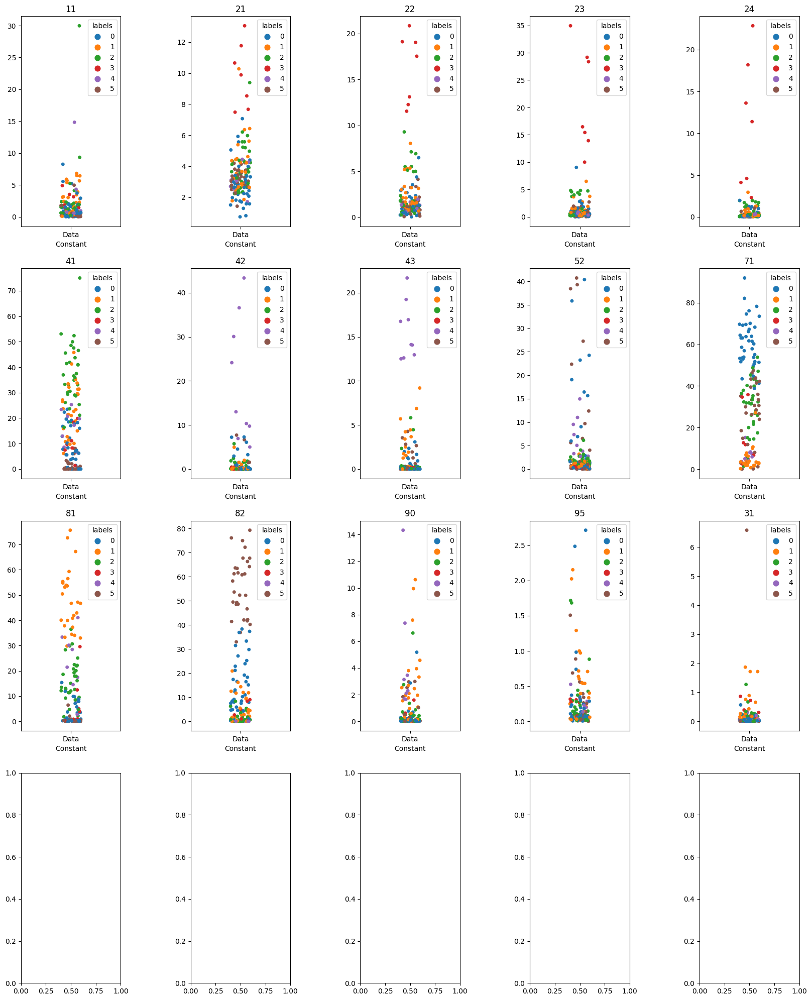

In [19]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) #create a 4x5 grid of empty figures where we will plot our feature plots. We will have a couple empty ones.
f.subplots_adjust(hspace=0.2, wspace=0.7) #Scooch em apart, give em some room
#In this for loop, I step through every column that I want to plot. This is a 4x5 grid, so I split this up by rows of 5 in the else if statements
for i in range(0,len(list(labeledClasses))-2): #minus two because I don't want to plot labels or constant
    col = labeledClasses.columns[i]
    if i < 5:
        ax = sns.stripplot(x=labeledClasses['Constant'],y=labeledClasses[col].values,hue=labeledClasses['labels'],jitter=True,ax=axes[0,(i)])
        ax.set_title(col)
    elif i >= 5 and i<10:
        ax = sns.stripplot(x=labeledClasses['Constant'],y=labeledClasses[col].values,hue=labeledClasses['labels'],jitter=True,ax=axes[1,(i-5)]) #so if i=6 it is row 1 column 1
        ax.set_title(col)
    elif i >= 10 and i<15:
        ax = sns.stripplot(x=labeledClasses['Constant'],y=labeledClasses[col].values,hue=labeledClasses['labels'],jitter=True,ax=axes[2,(i-10)])
        ax.set_title(col)
    elif i >= 15:
        ax = sns.stripplot(x=labeledClasses['Constant'],y=labeledClasses[col].values,hue=labeledClasses['labels'],jitter=True,ax=axes[3,(i-15)])
        ax.set_title(col)

/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 25.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 9.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 39.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 59.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarn

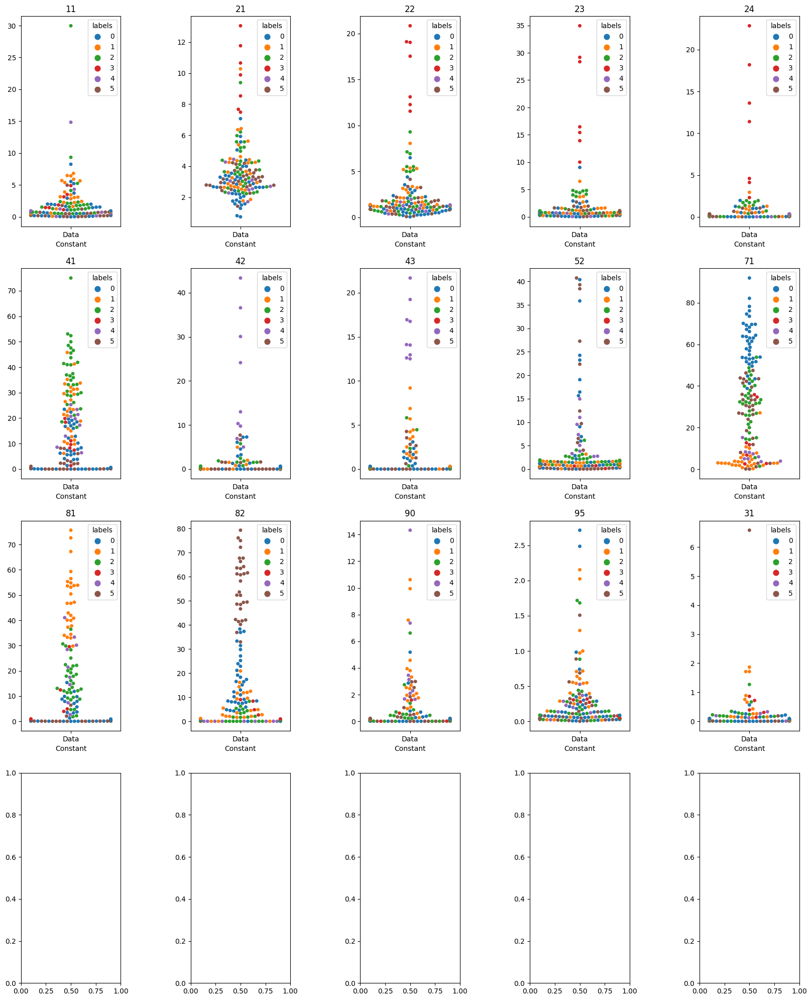

In [20]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) 
f.subplots_adjust(hspace=0.2, wspace=0.7)
for i in range(0,len(list(labeledClasses))-2):
    col = labeledClasses.columns[i]
    if i < 5:
        ax = sns.swarmplot(x=labeledClasses['Constant'],y=labeledClasses[col].values,hue=labeledClasses['labels'],ax=axes[0,(i)])
        ax.set_title(col)
    elif i >= 5 and i<10:
        ax = sns.swarmplot(x=labeledClasses['Constant'],y=labeledClasses[col].values,hue=labeledClasses['labels'],ax=axes[1,(i-5)])
        ax.set_title(col)
    elif i >= 10 and i<15:
        ax = sns.swarmplot(x=labeledClasses['Constant'],y=labeledClasses[col].values,hue=labeledClasses['labels'],ax=axes[2,(i-10)])
        ax.set_title(col)
    elif i >= 15:
        ax = sns.swarmplot(x=labeledClasses['Constant'],y=labeledClasses[col].values,hue=labeledClasses['labels'],ax=axes[3,(i-15)])
        ax.set_title(col)

In [21]:
classes = df_lulc['station']
classes = pd.concat((classes,labels),axis=1)
classes = classes.rename({'station':'station',0:'Cluster'},axis=1)
sortclasses = classes.sort_values(['station'])
pd.set_option('display.max_rows', 1000)
sortclasses['lon'] = ok_df_lons
sortclasses['lat'] = ok_df_lats

In [22]:
colors = ['black', 'blue', 'green', 'red', 'orange', 'yellow', 'white', 'purple', 'cyan', 'plum', 'coral', 'pink']
legend = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

colordict = {}

for x,_ in enumerate(colors):
    colordict.update({legend[x] : colors[x]})

sortclasses['color'] = sortclasses['Cluster'].map(colordict)

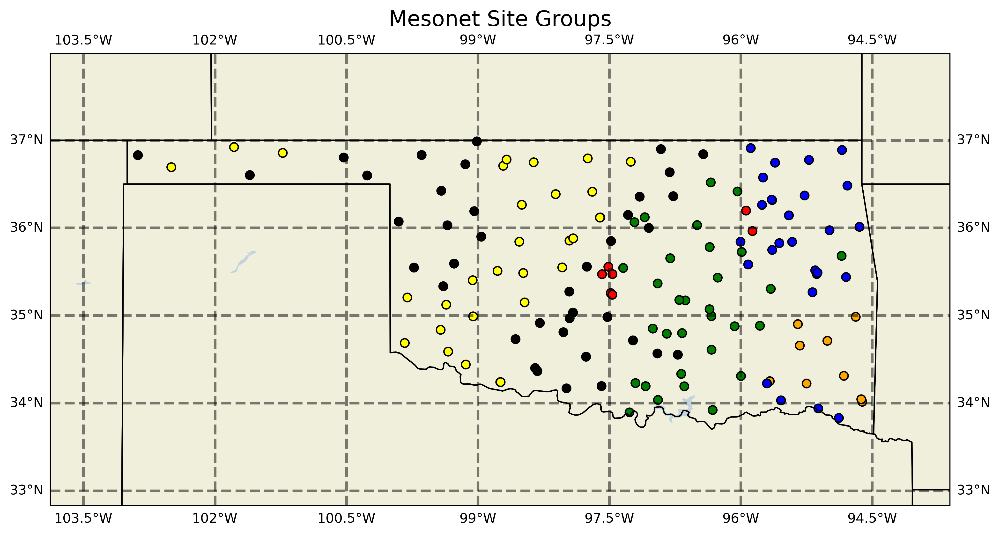

In [23]:
plurality_plot(sortclasses)

# Let's cluster on Elevation

In [24]:
elev_df = pd.read_csv('/home/aevans/landtype/elevation/data/OK/elev/ok30_df.csv')
elev_df.head()

,Unnamed: 0,station,elev,std,variance,skew,med_dist,lon,lat
0,0,ACME,397,28.782149,828.118766,0.168916,422.0,-98.02325,34.80833
1,1,ADAX,295,44.364079,1967.475770,0.239160,304.0,-96.66909,34.79851
2,2,ALTU,416,27.111264,734.760977,0.556609,412.0,-99.33808,34.58722
3,3,ALV2,439,39.008927,1521.158657,0.418186,437.0,-98.70974,36.70823
4,4,ALVA,450,44.431868,1973.492057,0.321617,461.0,-98.67170,36.77970


In [25]:
#exclude the categorical columns
features_elev = elev_df.drop(['station', 'Unnamed: 0', 'lon', 'lat'],axis=1)

In [26]:
# noramalize data
scaler = preprocessing.MinMaxScaler()
features_norm = scaler.fit_transform(features_elev)

In [27]:
pd.DataFrame(features_norm).describe()

,0,1,2,3,4
count,144.000000,144.000000,144.000000,144.000000,144.000000
mean,0.201143,0.239989,0.130519,0.338321,0.220116
std,0.164687,0.181662,0.148886,0.191475,0.171073
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.100248,0.096676,0.032786,0.206312,0.114644
50%,0.160066,0.176362,0.070085,0.285509,0.176151
75%,0.243812,0.339277,0.175266,0.399917,0.268201
max,1.000000,1.000000,1.000000,1.000000,1.000000


In [28]:
# kmeans clustering 
inertia_elev = []
K = range(1,15)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_norm)
    kmeanModel.fit(features_norm)
    inertia_elev.append(kmeanModel.inertia_)

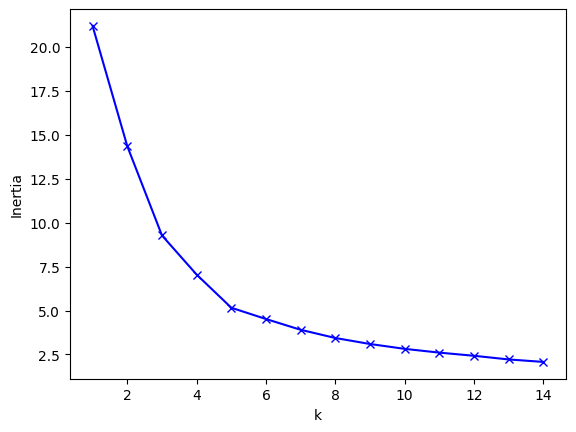

In [29]:
# Plot the elbow
plt.plot(K, inertia_elev, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.show()

In [30]:
# let's say our elbow is 12
kmeans_elev = KMeans(n_clusters=6).fit(features_norm)

In [31]:
labels_elev = pd.DataFrame(kmeans_elev.labels_) #This is where the label output of the KMeans we just ran lives. Make it a dataframe so we can concatenate back to the original data
labeledElev = pd.concat((features_elev,labels_elev),axis=1)
labeledElev = labeledElev.rename({0:'labels'},axis=1)

In [32]:
labeledElev.head()

,elev,std,variance,skew,med_dist,labels
0,397,28.782149,828.118766,0.168916,422.0,0
1,295,44.364079,1967.475770,0.239160,304.0,1
2,416,27.111264,734.760977,0.556609,412.0,0
3,439,39.008927,1521.158657,0.418186,437.0,1
4,450,44.431868,1973.492057,0.321617,461.0,1


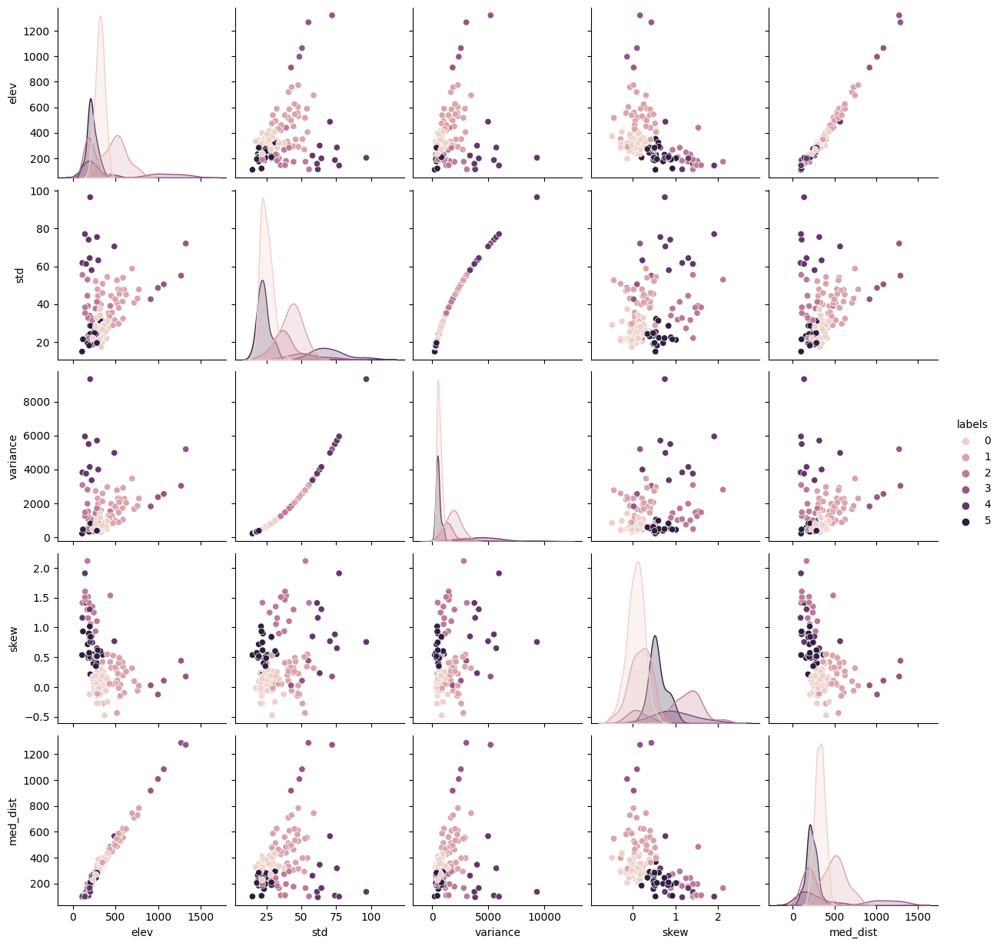

In [33]:
sns.pairplot(labeledElev,hue='labels')

In [34]:
labeledElev['Constant'] = "Data" #This is just to add something constant for the strip/swarm plots' X axis. Can be anything you want it to be.

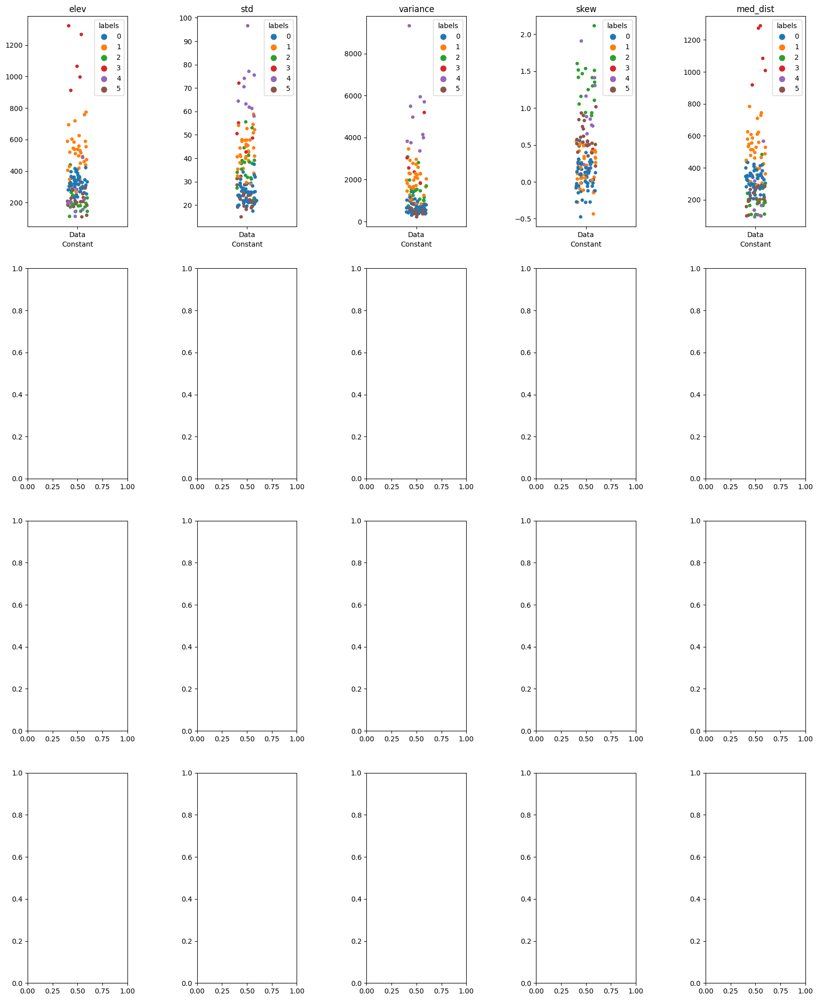

In [35]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) #create a 4x5 grid of empty figures where we will plot our feature plots. We will have a couple empty ones.
f.subplots_adjust(hspace=0.2, wspace=0.7) #Scooch em apart, give em some room
#In this for loop, I step through every column that I want to plot. This is a 4x5 grid, so I split this up by rows of 5 in the else if statements
for i in range(0,len(list(labeledElev))-2): #minus two because I don't want to plot labels or constant
    col = labeledElev.columns[i]
    if i < 5:
        ax = sns.stripplot(x=labeledElev['Constant'],y=labeledElev[col].values,hue=labeledElev['labels'],jitter=True,ax=axes[0,(i)])
        ax.set_title(col)
    elif i >= 5 and i<10:
        ax = sns.stripplot(x=labeledElev['Constant'],y=labeledElev[col].values,hue=labeledElev['labels'],jitter=True,ax=axes[1,(i-5)]) #so if i=6 it is row 1 column 1
        ax.set_title(col)
    elif i >= 10 and i<15:
        ax = sns.stripplot(x=labeledElev['Constant'],y=labeledElev[col].values,hue=labeledElev['labels'],jitter=True,ax=axes[2,(i-10)])
        ax.set_title(col)
    elif i >= 15:
        ax = sns.stripplot(x=labeledElev['Constant'],y=labeledElev[col].values,hue=labeledElev['labels'],jitter=True,ax=axes[3,(i-15)])
        ax.set_title(col)

/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 6.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


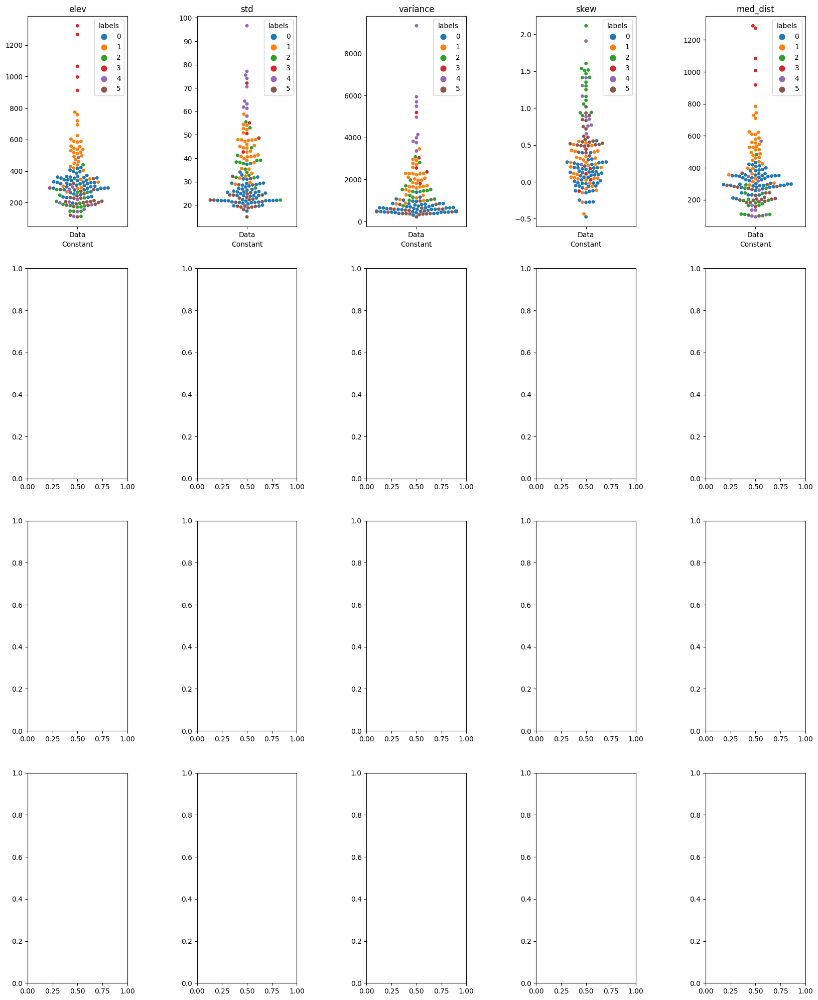

In [36]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) 
f.subplots_adjust(hspace=0.2, wspace=0.7)
for i in range(0,len(list(labeledElev))-2):
    col = labeledElev.columns[i]
    if i < 5:
        ax = sns.swarmplot(x=labeledElev['Constant'],y=labeledElev[col].values,hue=labeledElev['labels'],ax=axes[0,(i)])
        ax.set_title(col)
    elif i >= 5 and i<10:
        ax = sns.swarmplot(x=labeledElev['Constant'],y=labeledElev[col].values,hue=labeledElev['labels'],ax=axes[1,(i-5)])
        ax.set_title(col)
    elif i >= 10 and i<15:
        ax = sns.swarmplot(x=labeledElev['Constant'],y=labeledElev[col].values,hue=labeledElev['labels'],ax=axes[2,(i-10)])
        ax.set_title(col)
    elif i >= 15:
        ax = sns.swarmplot(x=labeledElev['Constant'],y=labeledElev[col].values,hue=labeledElev['labels'],ax=axes[3,(i-15)])
        ax.set_title(col)

In [37]:
elevs = df_lulc['station']
elevs = pd.concat((elevs,labels_elev),axis=1)
elevs = elevs.rename({'station':'station',0:'Cluster'},axis=1)
sortelevs = elevs.sort_values(['station'])
pd.set_option('display.max_rows', 1000)
sortelevs['lon'] = ok_df_lons
sortelevs['lat'] = ok_df_lats

In [38]:
colors = ['black', 'blue', 'green', 'red', 'orange', 'yellow', 'white', 'purple', 'cyan', 'plum', 'coral', 'pink']
legend = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

colordict = {}

for x,_ in enumerate(colors):
    colordict.update({legend[x] : colors[x]})

sortelevs['color'] = sortelevs['Cluster'].map(colordict)

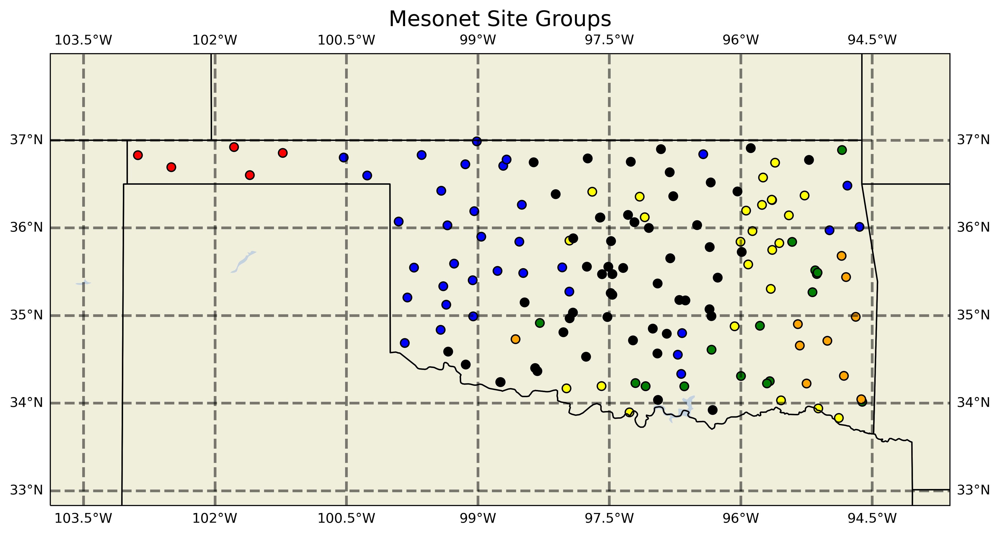

In [39]:
plurality_plot(sortelevs)

# let's cluster on slope

In [40]:
slope_df = pd.read_csv('/home/aevans/landtype/elevation/data/OK/slope/sl_percent_30.csv')
slope_df.head()

,site,19,25,21,23,24,27,28,22,26,station
0,0,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ACME
1,1,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ADAX
2,2,99.964145,0.035855,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ALTU
3,3,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ALV2
4,4,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ALVA


In [41]:
#exclude the categorical columns
features_slope = slope_df.drop(['site', 'station'],axis=1)

In [42]:
# noramalize data
scaler = preprocessing.MinMaxScaler()
features_norm_sl = scaler.fit_transform(features_slope)

In [43]:
pd.DataFrame(features_norm_sl).describe()

,0,1,2,3,4,5,6,7,8
count,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000
mean,0.971697,0.021236,0.020394,0.039596,0.023176,0.030693,0.024126,0.031229,0.023612
std,0.132695,0.112115,0.114675,0.143411,0.107919,0.118626,0.115241,0.134334,0.116304
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [44]:
# kmeans clustering 
inertia_slope = []
K = range(1,15)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_norm_sl)
    kmeanModel.fit(features_norm_sl)
    inertia_slope.append(kmeanModel.inertia_)

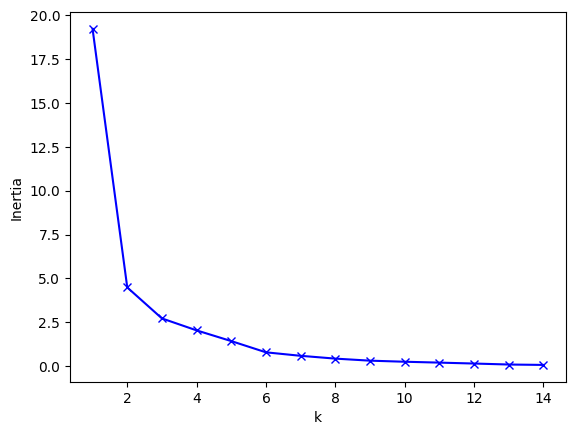

In [45]:
# Plot the elbow
plt.plot(K, inertia_slope, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.show()

In [46]:
# let's say our elbow is 12
kmeans_slope = KMeans(n_clusters=4).fit(features_norm_sl)

In [47]:
labels_slope = pd.DataFrame(kmeans_slope.labels_) #This is where the label output of the KMeans we just ran lives. Make it a dataframe so we can concatenate back to the original data
labeledSlope = pd.concat((features_slope,labels_slope),axis=1)
labeledSlope = labeledSlope.rename({0:'labels'},axis=1)

In [48]:
labeledSlope.head()

,19,25,21,23,24,27,28,22,26,labels
0,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,99.964145,0.035855,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


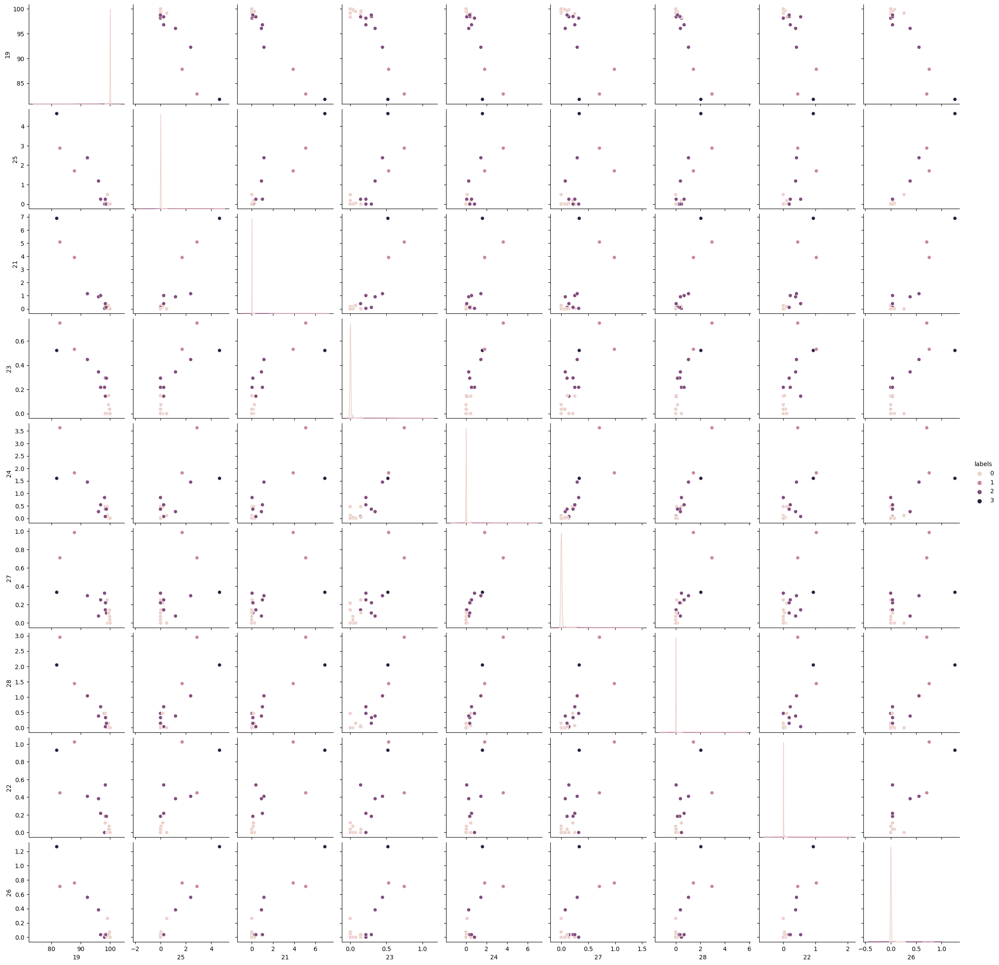

In [49]:
sns.pairplot(labeledSlope,hue='labels')

In [50]:
labeledSlope['Constant'] = "Data" #This is just to add something constant for the strip/swarm plots' X axis. Can be anything you want it to be.

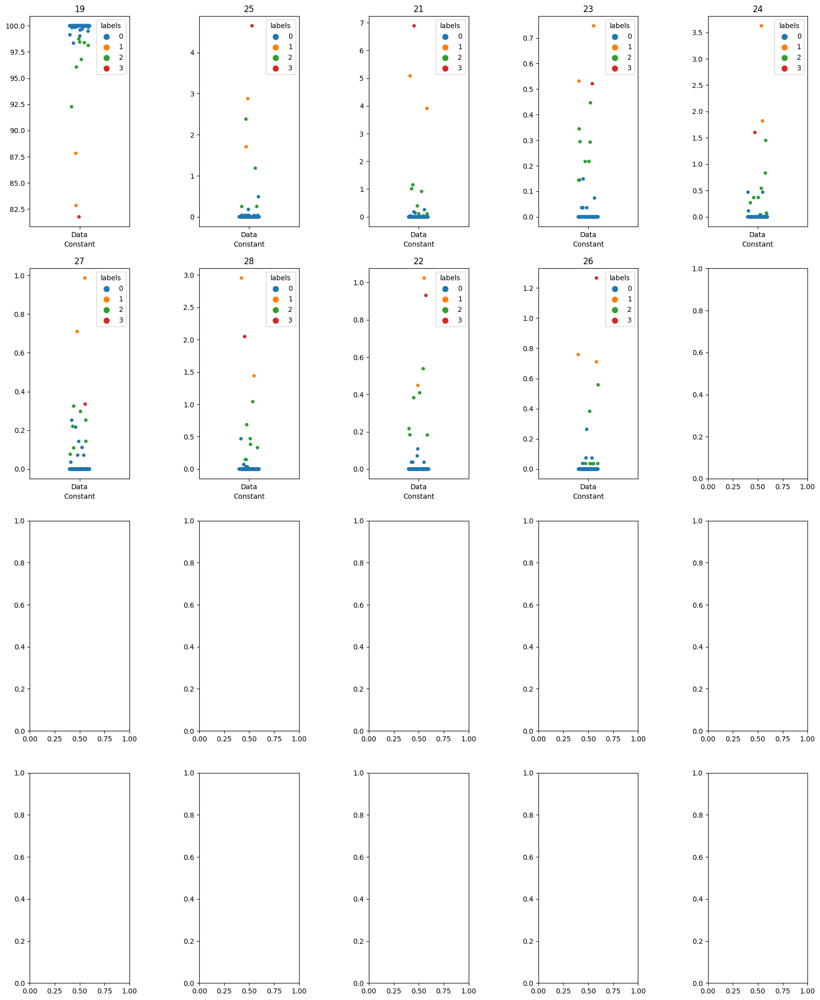

In [51]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) #create a 4x5 grid of empty figures where we will plot our feature plots. We will have a couple empty ones.
f.subplots_adjust(hspace=0.2, wspace=0.7) #Scooch em apart, give em some room
#In this for loop, I step through every column that I want to plot. This is a 4x5 grid, so I split this up by rows of 5 in the else if statements
for i in range(0,len(list(labeledSlope))-2): #minus two because I don't want to plot labels or constant
    col = labeledSlope.columns[i]
    if i < 5:
        ax = sns.stripplot(x=labeledSlope['Constant'],y=labeledSlope[col].values,hue=labeledSlope['labels'],jitter=True,ax=axes[0,(i)])
        ax.set_title(col)
    elif i >= 5 and i<10:
        ax = sns.stripplot(x=labeledSlope['Constant'],y=labeledSlope[col].values,hue=labeledSlope['labels'],jitter=True,ax=axes[1,(i-5)]) #so if i=6 it is row 1 column 1
        ax.set_title(col)
    elif i >= 10 and i<15:
        ax = sns.stripplot(x=labeledSlope['Constant'],y=labeledSlope[col].values,hue=labeledSlope['labels'],jitter=True,ax=axes[2,(i-10)])
        ax.set_title(col)
    elif i >= 15:
        ax = sns.stripplot(x=labeledSlope['Constant'],y=labeledSlope[col].values,hue=labeledSlope['labels'],jitter=True,ax=axes[3,(i-15)])
        ax.set_title(col)

/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 74.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 79.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 77.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 73.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWar

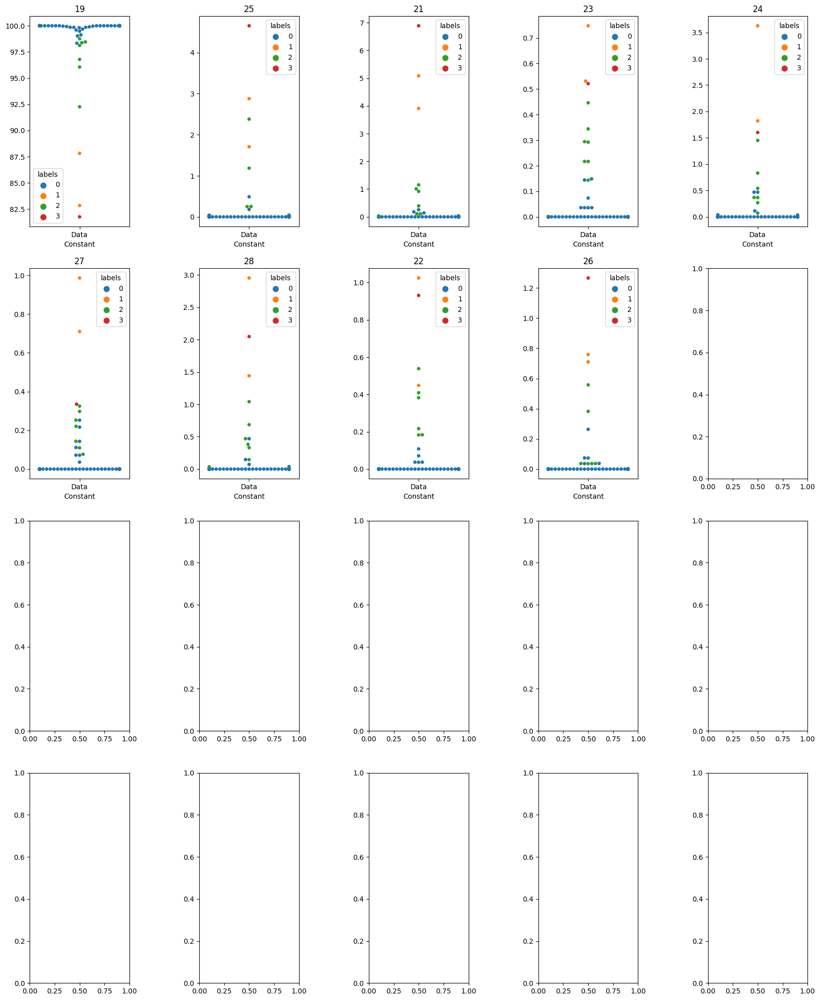

In [52]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) 
f.subplots_adjust(hspace=0.2, wspace=0.7)
for i in range(0,len(list(labeledSlope))-2):
    col = labeledSlope.columns[i]
    if i < 5:
        ax = sns.swarmplot(x=labeledSlope['Constant'],y=labeledSlope[col].values,hue=labeledSlope['labels'],ax=axes[0,(i)])
        ax.set_title(col)
    elif i >= 5 and i<10:
        ax = sns.swarmplot(x=labeledSlope['Constant'],y=labeledSlope[col].values,hue=labeledSlope['labels'],ax=axes[1,(i-5)])
        ax.set_title(col)
    elif i >= 10 and i<15:
        ax = sns.swarmplot(x=labeledSlope['Constant'],y=labeledSlope[col].values,hue=labeledSlope['labels'],ax=axes[2,(i-10)])
        ax.set_title(col)
    elif i >= 15:
        ax = sns.swarmplot(x=labeledSlope['Constant'],y=labeledSlope[col].values,hue=labeledSlope['labels'],ax=axes[3,(i-15)])
        ax.set_title(col)

In [53]:
slopes = df_lulc['station']
slopes = pd.concat((slopes,labels_slope),axis=1)
slopes = slopes.rename({'station':'station',0:'Cluster'},axis=1)
sortslopes = slopes.sort_values(['station'])
pd.set_option('display.max_rows', 1000)
sortslopes['lon'] = ok_df_lons
sortslopes['lat'] = ok_df_lats

In [54]:
colors = ['black', 'blue', 'green', 'red', 'orange', 'yellow', 'white', 'purple', 'cyan', 'plum', 'coral', 'pink']
legend = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

colordict = {}

for x,_ in enumerate(colors):
    colordict.update({legend[x] : colors[x]})

sortslopes['color'] = sortslopes['Cluster'].map(colordict)

Slopes
Landtype
Elevation


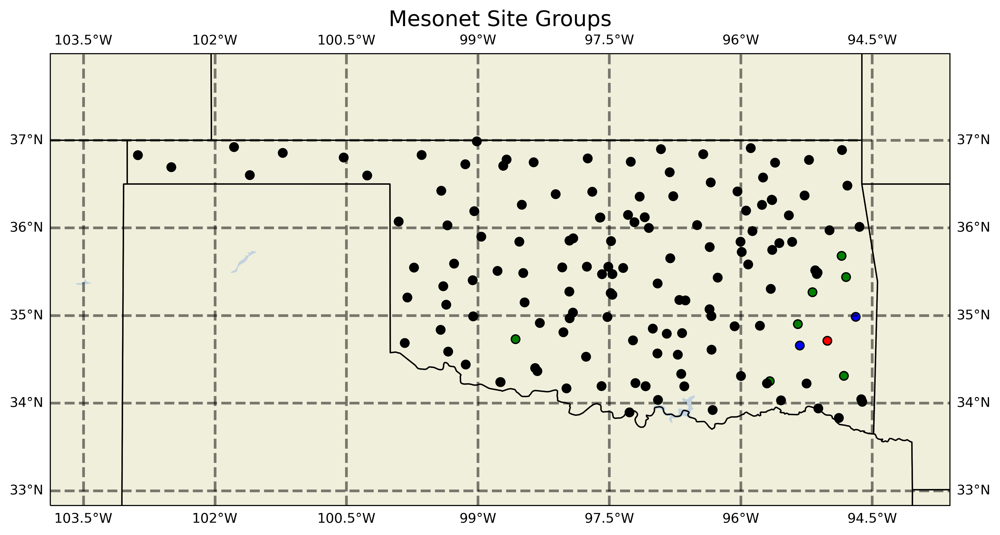

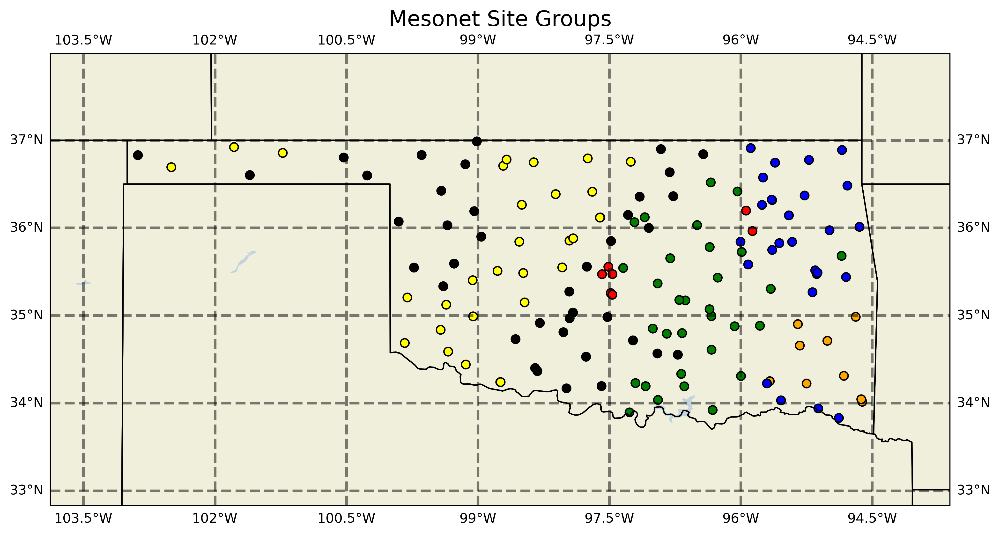

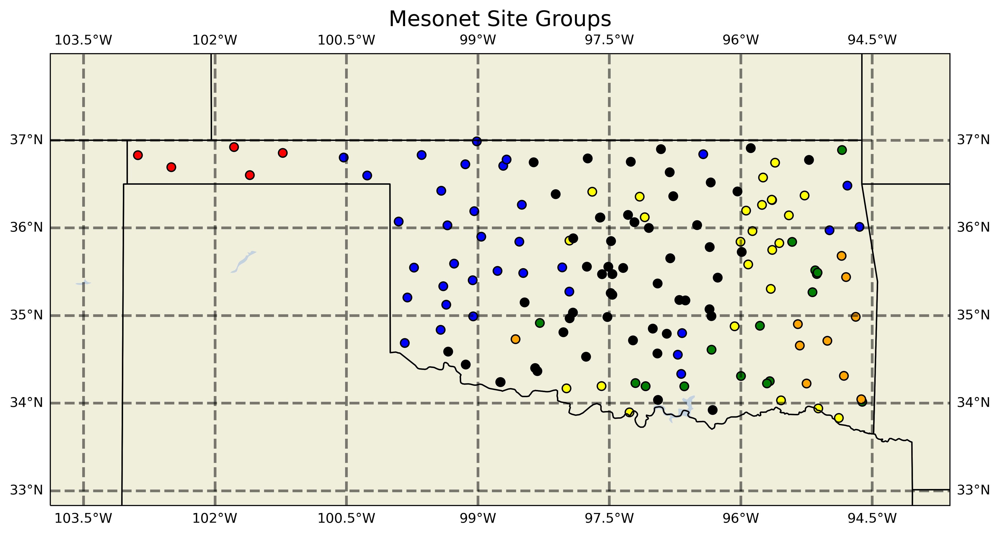

In [55]:
print("Slopes")
plurality_plot(sortslopes)
print('Landtype')
plurality_plot(sortclasses)
print('Elevation')
plurality_plot(sortelevs)

In [56]:
# for i in np.arange(1,7):
#     slopes_cat = sortslopes.loc[sortslopes['Cluster'] == i]
#     slopes_cat = slopes_cat.loc[sortelevs['Cluster'] == i]
#     print(f'category {i}', slopes_cat)
#     slopes_cat.to_csv(f'/home/aevans/landtype/data/clean_cats/ok/df_{i}.csv')

In [57]:
# dirs = sorted(os.listdir('/home/aevans/landtype/data/clean_cats/ok/'))

In [58]:
# for n,_ in enumerate(dirs):
#     df = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ok/{dirs[n]}')
#     plurality_plot(df)

# Let's Cluster on All Vars

In [59]:
comb = pd.merge(df_lulc, elev_df, on='station')
comb_df = pd.merge(comb, slope_df, on='station')

In [60]:
comb_df.head()

,site_x,11,21_x,22_x,23_x,24_x,41,42,43,52,...,site_y,19,25,21_y,23_y,24_y,27,28,22_y,26
0,1,0.332355,3.116118,0.919708,0.467876,0.086527,16.744980,0.036960,0.042977,1.436291,...,0,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0.764413,5.189585,4.973268,3.738690,1.367520,40.982907,0.226917,0.289377,1.609622,...,1,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0.510838,4.186125,4.143149,1.960840,1.050900,0.495367,0.024353,0.610829,6.516271,...,2,99.964145,0.035855,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0.176787,2.495645,1.090233,0.849837,0.167045,0.107734,0.000287,0.000000,0.007736,...,3,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0.556138,2.765219,2.132579,1.728297,0.351275,0.242970,0.001719,0.060743,0.019770,...,4,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [61]:
features_all = comb_df.drop(['site_x', 'station', 'variance', 'Unnamed: 0', 'lon', 'lat', 'site_y'], axis=1)

In [62]:
features_all.head()

,11,21_x,22_x,23_x,24_x,41,42,43,52,71,...,med_dist,19,25,21_y,23_y,24_y,27,28,22_y,26
0,0.332355,3.116118,0.919708,0.467876,0.086527,16.744980,0.036960,0.042977,1.436291,70.056214,...,422.0,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.764413,5.189585,4.973268,3.738690,1.367520,40.982907,0.226917,0.289377,1.609622,31.853214,...,304.0,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.510838,4.186125,4.143149,1.960840,1.050900,0.495367,0.024353,0.610829,6.516271,1.212776,...,412.0,99.964145,0.035855,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.176787,2.495645,1.090233,0.849837,0.167045,0.107734,0.000287,0.000000,0.007736,35.968230,...,437.0,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.556138,2.765219,2.132579,1.728297,0.351275,0.242970,0.001719,0.060743,0.019770,29.984184,...,461.0,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [63]:
# noramalize data
scaler = preprocessing.MinMaxScaler()
features_norm_a = scaler.fit_transform(features_all)

In [64]:
# kmeans clustering 
inertia_elev = []
K = range(1,20)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_norm_a)
    kmeanModel.fit(features_norm_a)
    inertia_elev.append(kmeanModel.inertia_)

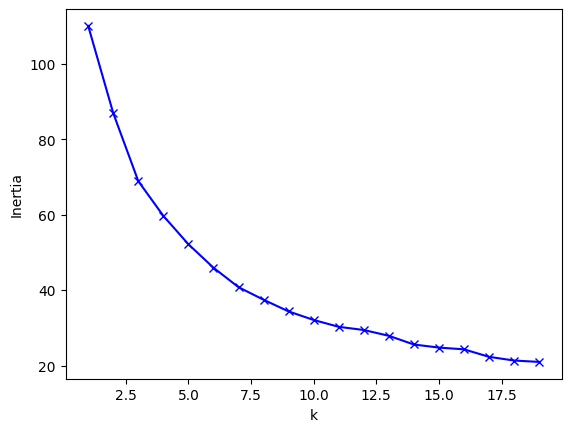

In [65]:
# Plot the elbow
plt.plot(K, inertia_elev, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.show()

In [66]:
# let's say our elbow is 12
kmeans_all = KMeans(n_clusters=6).fit(features_norm_a)

In [67]:
labels_a = pd.DataFrame(kmeans_all.labels_) #This is where the label output of the KMeans we just ran lives. Make it a dataframe so we can concatenate back to the original data
labeledAll = pd.concat((features_all, labels_a),axis=1)
labeledAll = labeledAll.rename({0:'labels'},axis=1)

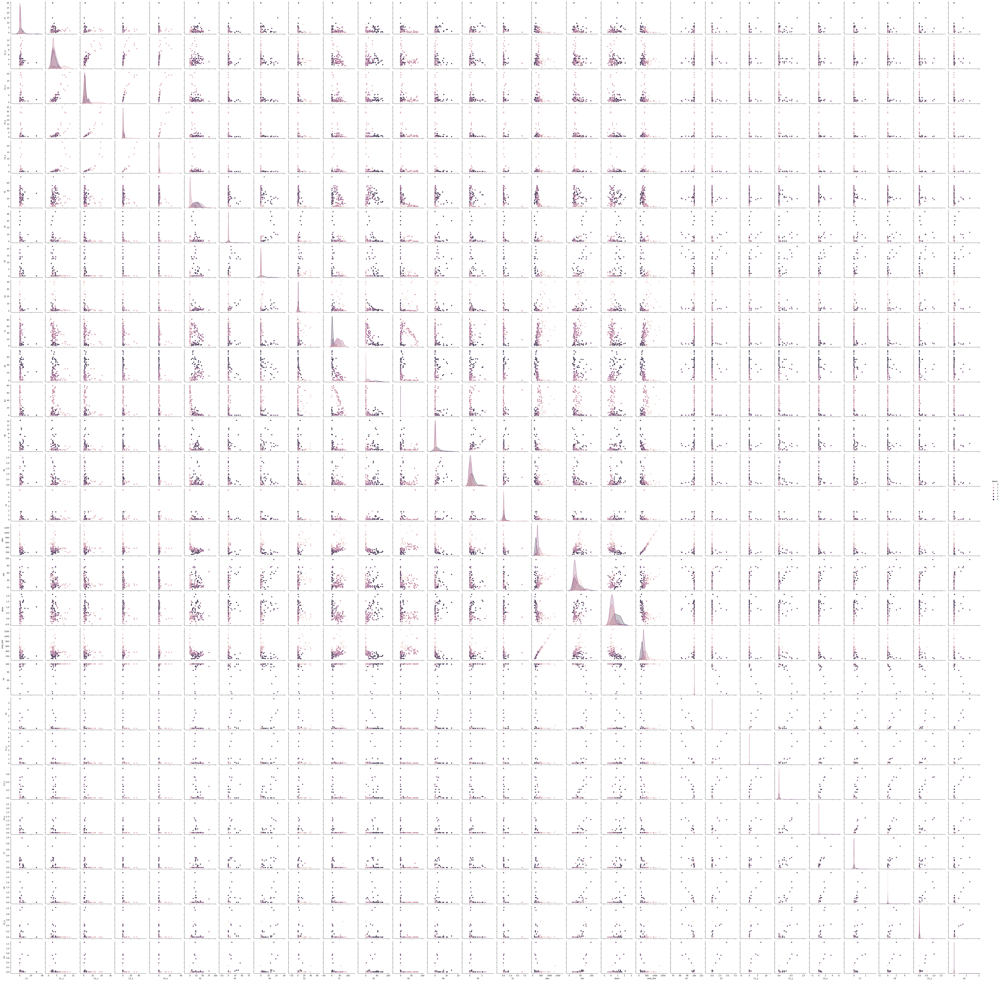

In [68]:
sns.pairplot(labeledAll,hue='labels')

In [69]:
labeledAll['Constant'] = "Data" #This is just to add something constant for the strip/swarm plots' X axis. Can be anything you want it to be.

In [70]:
# f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) #create a 4x5 grid of empty figures where we will plot our feature plots. We will have a couple empty ones.
# f.subplots_adjust(hspace=0.2, wspace=0.7) #Scooch em apart, give em some room
# #In this for loop, I step through every column that I want to plot. This is a 4x5 grid, so I split this up by rows of 5 in the else if statements
# for i in range(0,len(list(labeledAll))-2): #minus two because I don't want to plot labels or constant
#     col = labeledAll.columns[i]
#     if i < 5:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[0,(i)])
#         ax.set_title(col)
#     elif i >= 5 and i<10:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[1,(i-5)]) #so if i=6 it is row 1 column 1
#         ax.set_title(col)
#     elif i >= 10 and i<15:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[2,(i-10)])
#         ax.set_title(col)
#     elif i >= 15:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[3,(i-15)])
#         ax.set_title(col)

In [71]:
# f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) 
# f.subplots_adjust(hspace=0.2, wspace=0.7)
# for i in range(0,len(list(labeledAll))-2):
#     col = labeledAll.columns[i]
#     if i < 5:
#         ax = sns.swarmplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],ax=axes[0,(i)])
#         ax.set_title(col)
#     elif i >= 5 and i<10:
#         ax = sns.swarmplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],ax=axes[1,(i-5)])
#         ax.set_title(col)
#     elif i >= 10 and i<15:
#         ax = sns.swarmplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],ax=axes[2,(i-10)])
#         ax.set_title(col)
#     elif i >= 15:
#         ax = sns.swarmplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],ax=axes[3,(i-15)])
#         ax.set_title(col)

In [72]:
alls = df_lulc['station']
alls = pd.concat((alls,labels_a),axis=1)
alls = alls.rename({'station':'station',0:'Cluster'},axis=1)
sortAll = alls.sort_values(['station'])
pd.set_option('display.max_rows', 1000)
sortAll['lon'] = ok_df_lons
sortAll['lat'] = ok_df_lats

In [73]:
colors = ['black', 'blue', 'green', 'red', 'orange', 'yellow', 'grey', 'purple', 'cyan', 'plum', 'coral', 'pink']
legend = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

colordict = {}

for x,_ in enumerate(colors):
    colordict.update({legend[x] : colors[x]})

sortAll['color'] = sortAll['Cluster'].map(colordict)

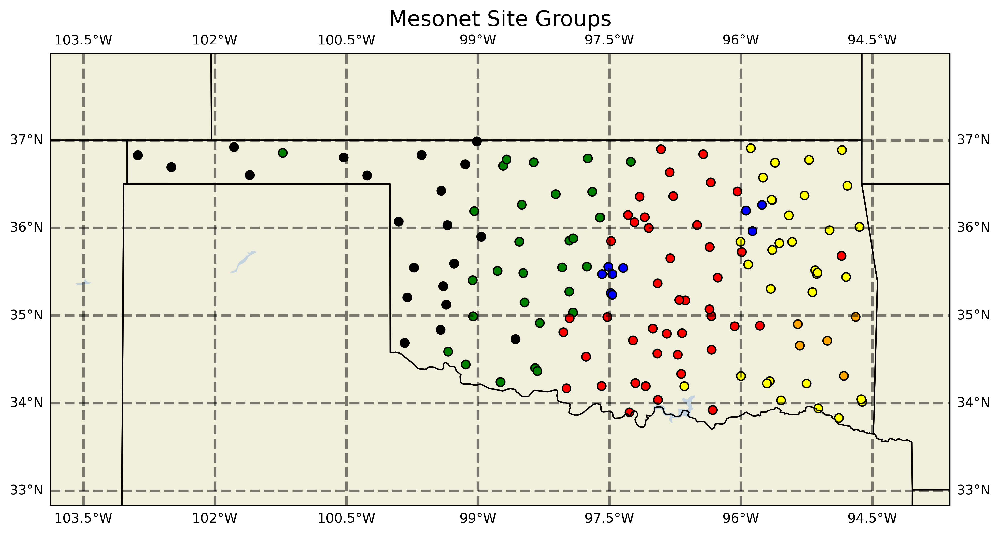

In [74]:
plurality_plot(sortAll)

In [75]:
df_land = pd.read_csv('/home/aevans/landtype/data/buffer_10_km/avg_lulc_ok_10.csv')

In [76]:
for i in np.arange(0,10):
    slopes_cat = sortAll.loc[sortAll['Cluster'] == i]
    slopes_cat = pd.merge(slopes_cat, comb_df, on='station')
    slopes_cat = pd.merge(slopes_cat, df_land, on= 'station')
    #slopes_cat.to_csv(f'/home/aevans/landtype/data/clean_cats/ok/df_{i}.csv')

In [82]:
def plurality_plot_x(df):
    projPC = crs.PlateCarree()
    latN = df['lat_x'].max()+1
    latS = df['lat_x'].min()-1
    lonW = df['lon_x'].max()+1
    lonE = df['lon_x'].min()-1
    cLat = (latN + latS) / 2
    cLon = (lonW + lonE) / 2
    projLcc = crs.LambertConformal(central_longitude=cLon, central_latitude=cLat)

    fig, ax = plt.subplots(figsize=(12,9), subplot_kw={'projection': crs.PlateCarree()}, dpi = 400)
    ax.set_extent([lonW, lonE, latS, latN], crs=projPC)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle='--');
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.STATES)
    ax.xticklabels_top = False
    ax.ylabels_right = False
    ax.gridlines(crs=crs.PlateCarree(), draw_labels=True,
                    linewidth=2, color='black', alpha=0.5, linestyle='--')
    ax.scatter(x=df['lon_x'],
                                        y=df['lat_x'],
                                        c=df['color'],
                                        s=40,
                                        marker = 'o',
                                        edgecolor = 'black', 
                                        transform=crs.PlateCarree()
                                        )
    ax.set_title('Mesonet Site Groups', size=16)
    ax.set_xlabel('Longitude',size=14)
    ax.set_ylabel('Latitude',size=14)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.grid()

In [83]:
dirs = sorted(os.listdir('/home/aevans/landtype/data/clean_cats/ok/'))

In [84]:
df_a = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ok/df_0.csv')

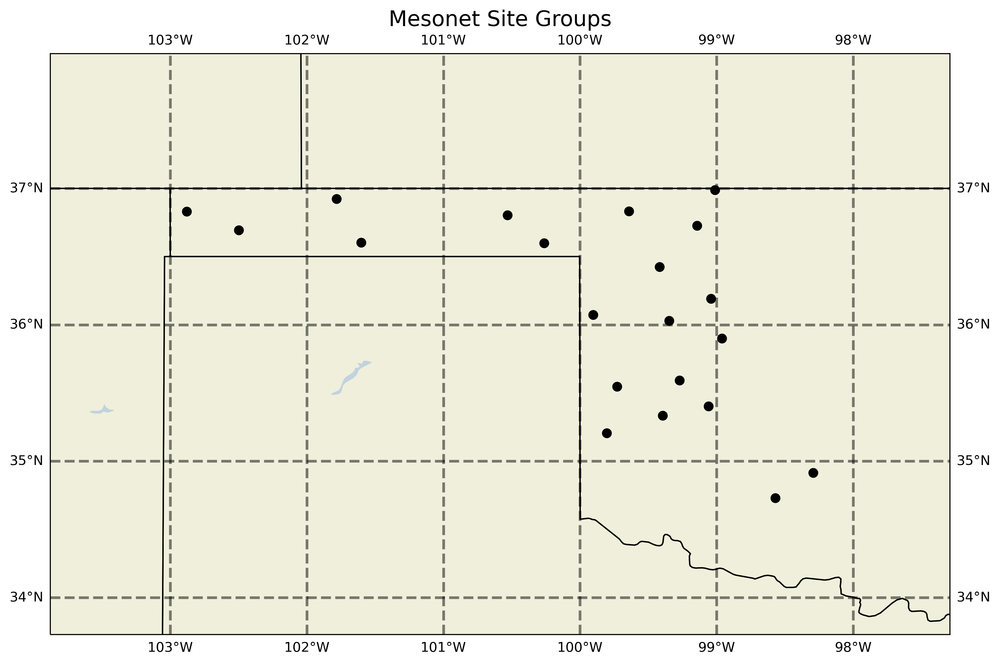

In [85]:
plurality_plot_x(df_a)

In [86]:
df_b = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ok/df_1.csv')

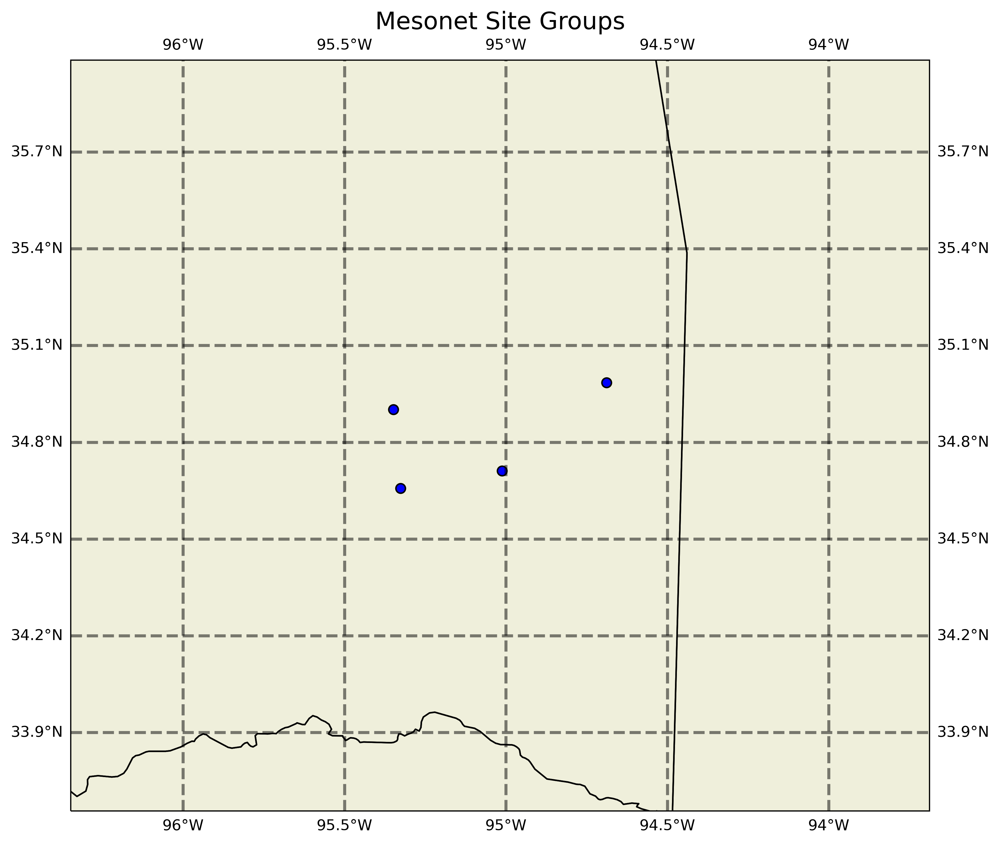

In [87]:
plurality_plot_x(df_b)

In [88]:
df_c = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ok/df_2.csv')

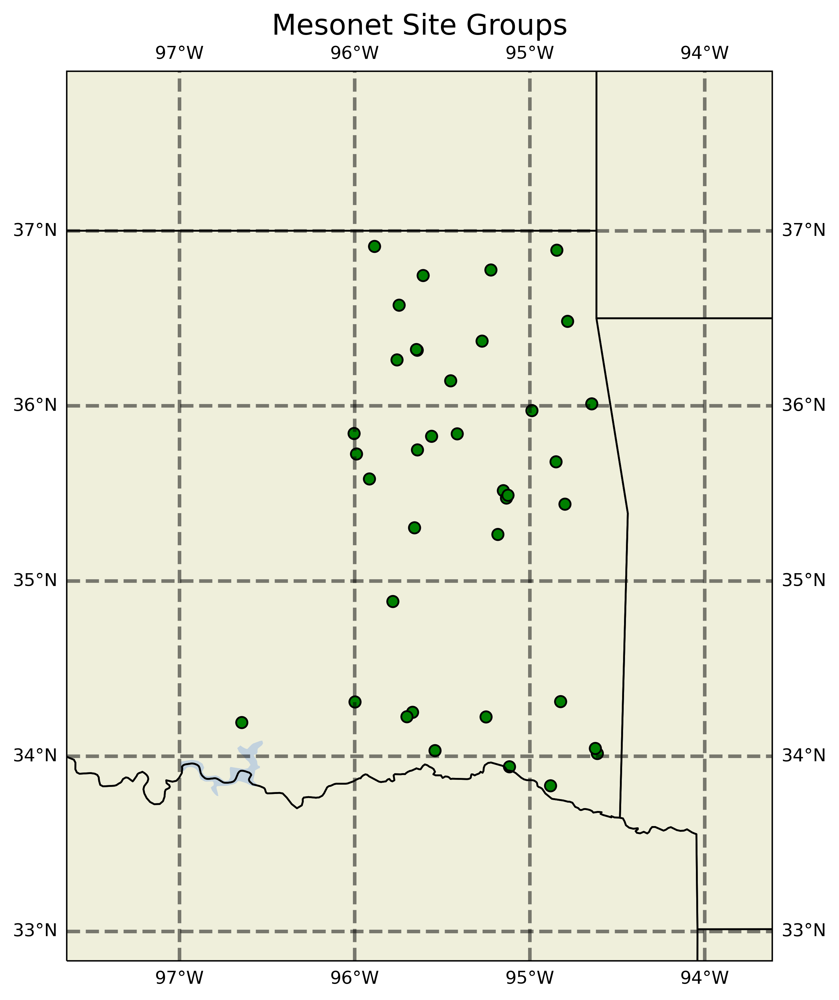

In [89]:
plurality_plot_x(df_c)

In [90]:
df_d = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ok/df_3.csv')

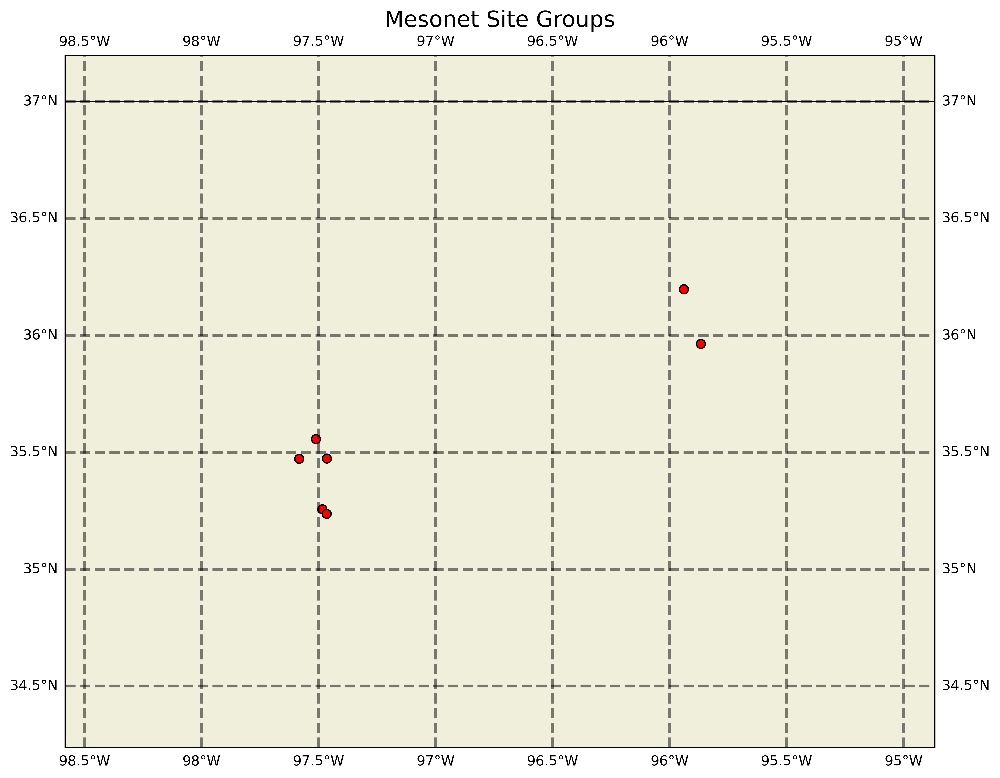

In [91]:
plurality_plot_x(df_d)

In [92]:
df_e = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ok/df_4.csv')

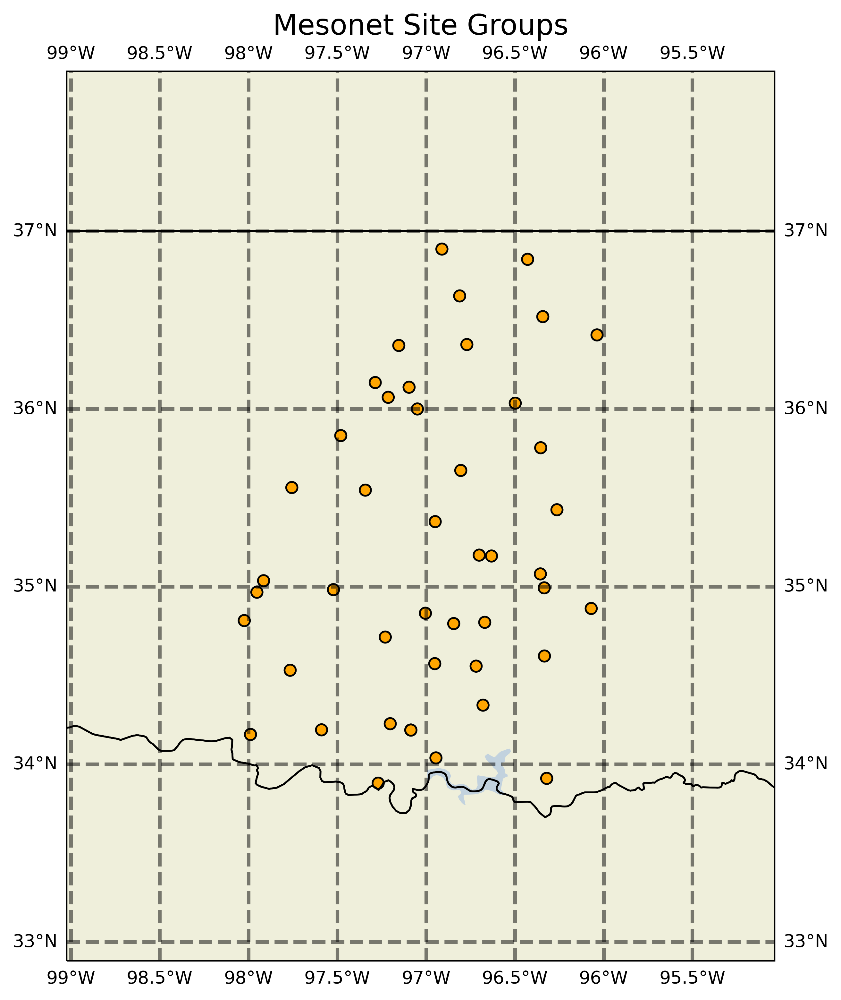

In [93]:
plurality_plot_x(df_e)

In [94]:
df_f = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ok/df_5.csv')

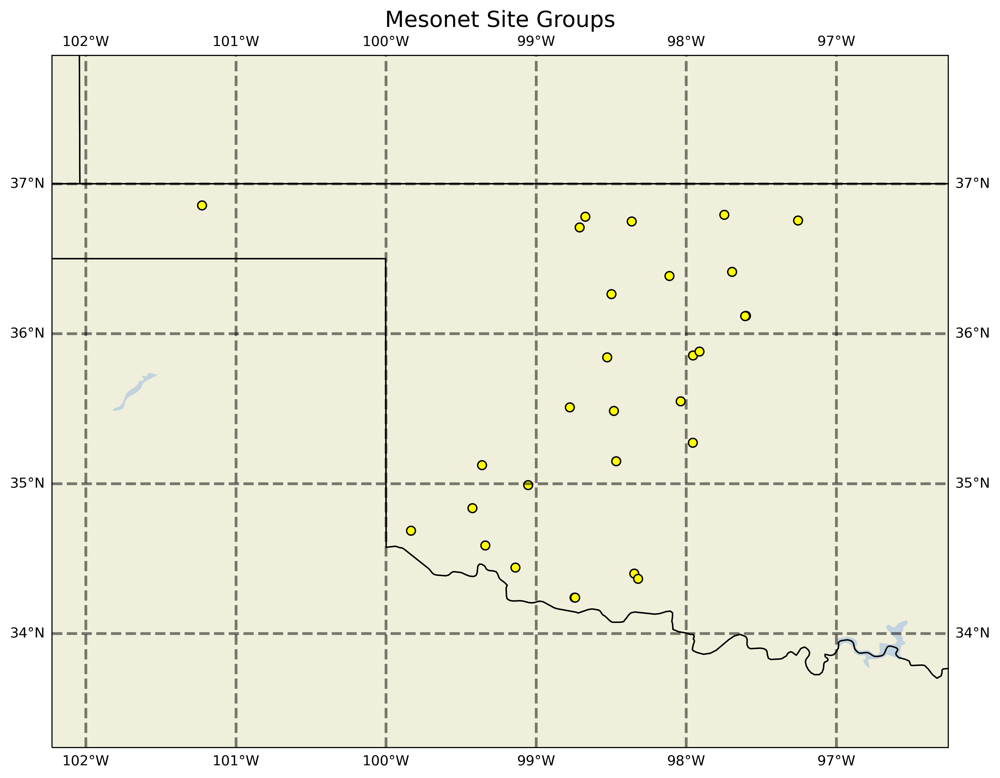

In [95]:
plurality_plot_x(df_f)

In [ ]:
# df_new_cats = pd.concat([df_a, df_b, df_c, df_d, df_e, df_f])
# df_new_cats.to_csv('/home/aevans/landtype/df_new_cats_ok.csv')

# Let's Explain the Clusters

In [ ]:
from kmeans_interp.kmeans_feature_imp import KMeansInterp

kms = KMeansInterp(n_clusters=len(sortAll['Cluster'].unique()), 
                   random_state=1, 
                   ordered_feature_names=features_all.keys(), 
                   feature_importance_method='wcss_min',
                  ).fit(features_all)
labels = kms.labels_
sortAll['Cluster'] = labels

In [ ]:
centroids = kms.cluster_centers_
num_clusters = kms.n_clusters
n_features = kms.n_features_in_
centroids_labels = pd.DataFrame({
    "centroid_dim": np.array([centroids[i] for i in range(len(centroids))]).flatten(),
    "cluster_label": np.array([np.repeat(label, n_features) for label in range(num_clusters)]).flatten()
})

In [ ]:
centroids_labels[centroids_labels['cluster_label'] == 0]['centroid_dim']

0       1.426042
1       3.816983
2       2.175682
3       1.379479
4       0.472379
5      25.438087
6       1.862729
7       0.926612
8       1.759501
9      33.414077
10     15.273704
11     11.068625
12      0.619720
13      0.217308
14      0.149074
15    280.608696
16     30.128133
17      0.295815
18    285.086957
19     99.833542
20      0.030490
21      0.031865
22      0.015477
23      0.024006
24      0.011164
25      0.028897
26      0.014663
27      0.009897
Name: centroid_dim, dtype: float64

In [ ]:
kms.feature_importances_[1][:-1]

[('med_dist', 1163.25),
 ('elev', 1162.75),
 ('19', 99.7836719337848),
 ('std', 56.58878021324483),
 ('71', 46.36840307520636),
 ('82', 31.144023925538587),
 ('52', 18.511777048076542),
 ('21_x', 2.791065826505541),
 ('22_x', 0.5773144037272184),
 ('23_x', 0.1890952328446609),
 ('95', 0.1610979452456628),
 ('skew', 0.14997926024574204),
 ('25', 0.12227238525206921),
 ('81', 0.0728445186984068),
 ('11', 0.06769101282294443),
 ('26', 0.0658389766741911),
 ('24_x', 0.0385355274796233),
 ('42', 0.03667663812765776),
 ('90', 0.029083111814956708),
 ('24_y', 0.028216704288939055),
 ('31', 0.012320099852992622),
 ('41', 7.163405884469398e-05),
 ('22_y', 0.0),
 ('21_y', 0.0),
 ('23_y', 0.0),
 ('43', 0.0),
 ('27', 0.0)]

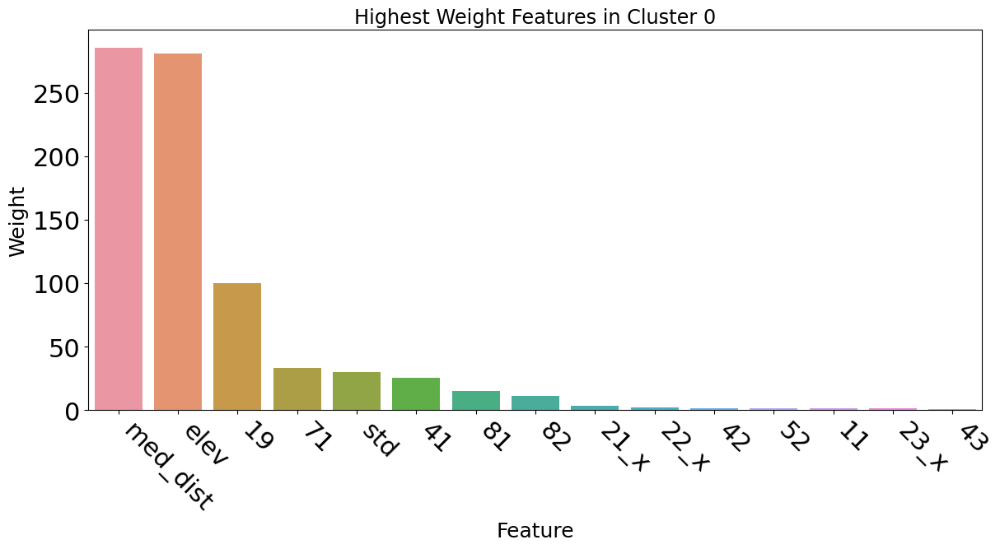

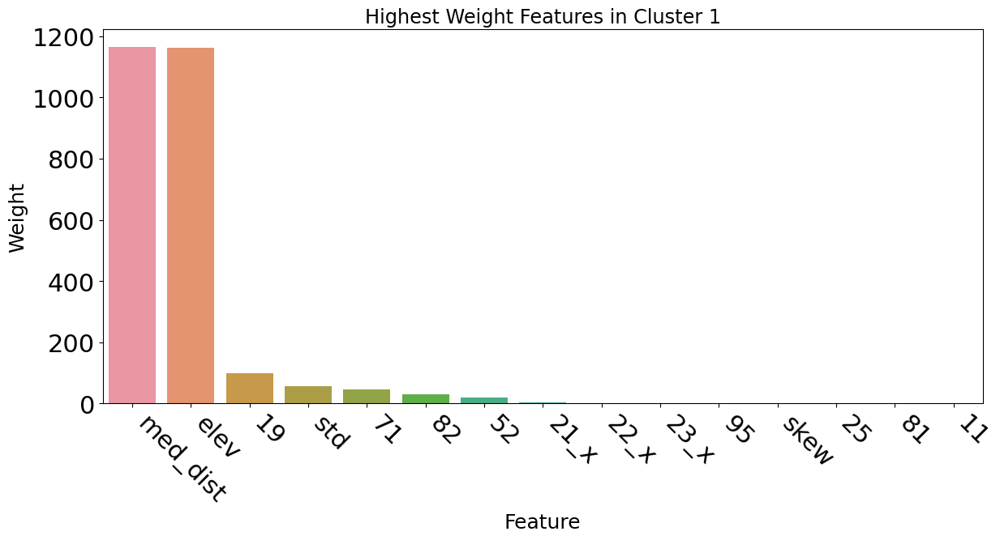

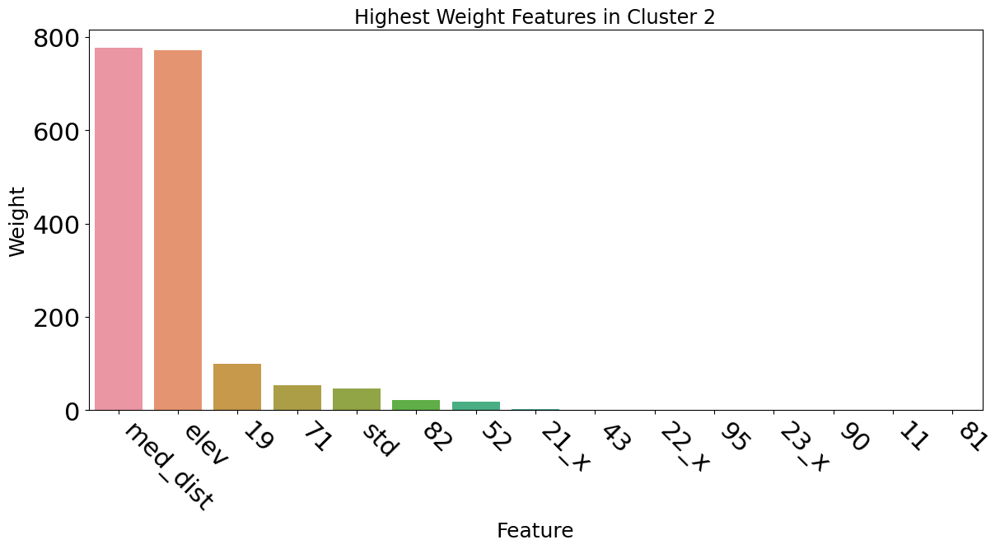

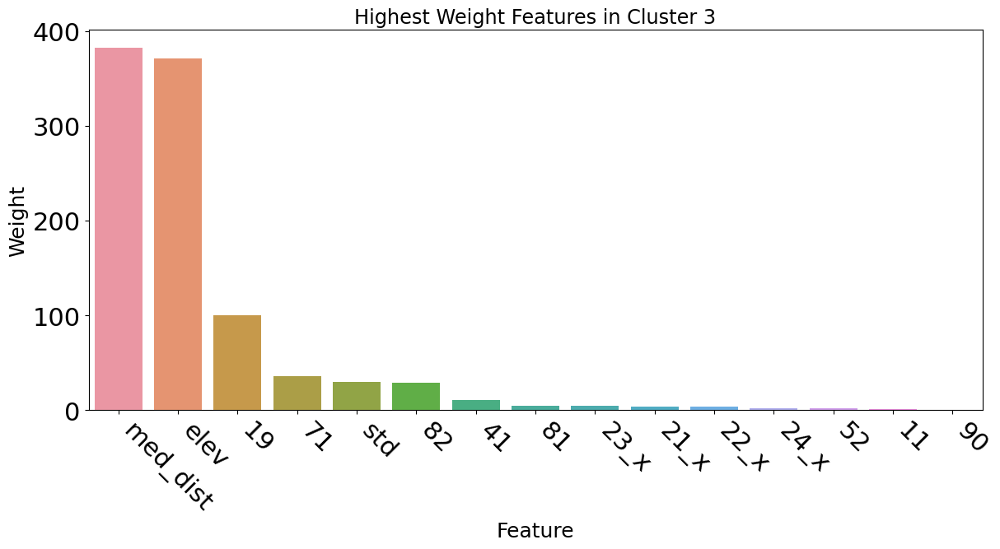

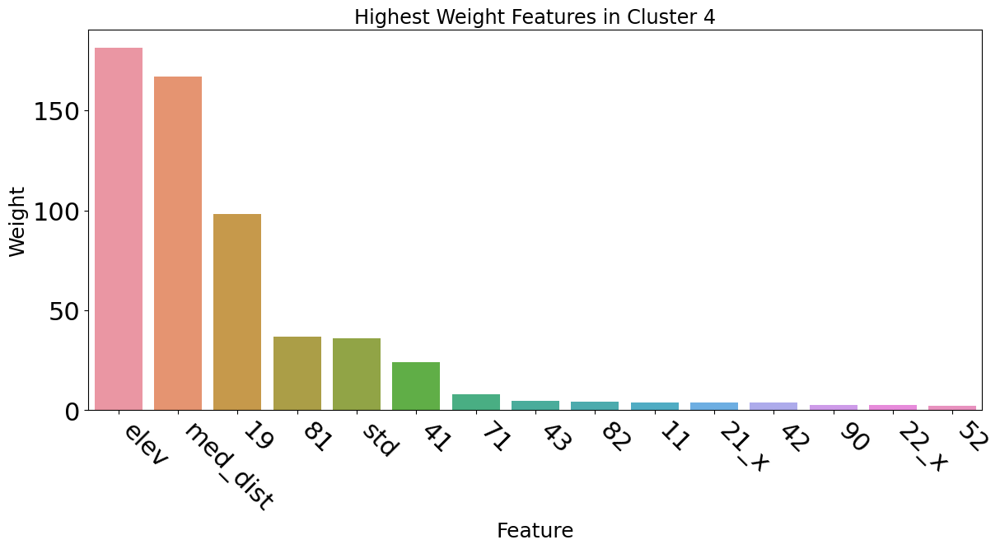

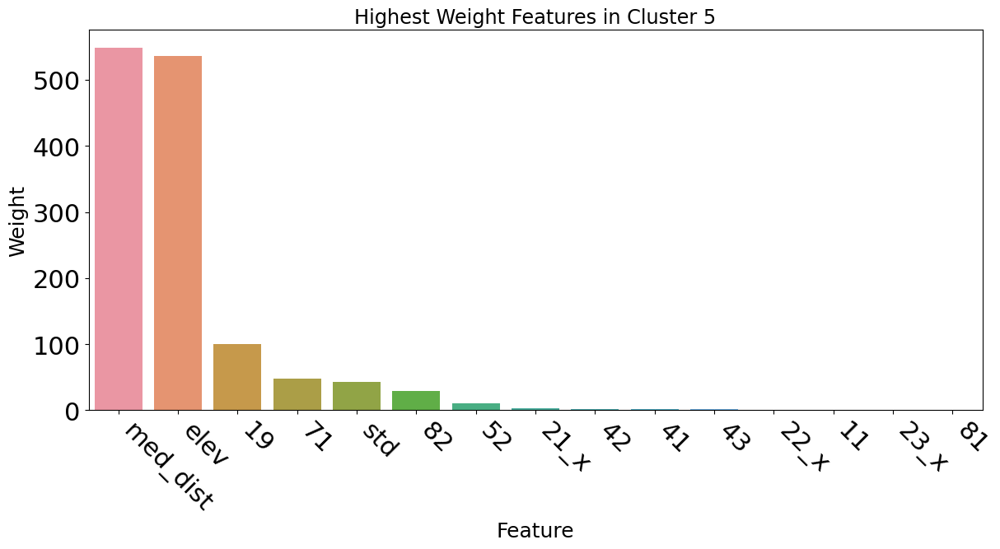

In [ ]:
for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:15], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(14,6))
    sns.barplot(x="Feature", y="Weight", data=df_feature_weight)
    plt.xticks(rotation=-45, ha="left");
    ax.tick_params(axis='both', which='major', labelsize=22)
    plt.title(f'Highest Weight Features in Cluster {cluster_label}', fontsize='xx-large')
    plt.xlabel('Feature', fontsize=18)
    plt.ylabel('Weight', fontsize=18)

    plt.show();
    
    print('\n\n')